# Plots the highest composite scores in each strain for manual selection of candidate mutations
   - Composite scores are generated with scripts provided by G. Lang based on his supervised machine learning approach 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re
%matplotlib inline

# Load data

In [2]:
#create dictionary to re-label chromosome IDs
chrom_str = list(['I','II','III','IV','V','VI','VII','VIII','IX','X','XI','XII','XIII','XIV','XV','XVI','MITO'])
chrom_num = range(1,17)
chrom_dict = dict(zip(chrom_num,chrom_str))

In [3]:
#define a function to check whether the allele is present in the ancestral genome data
def in_parent(row):
    allele_subset = parent_df[(parent_df['Chromosome']==row['CHROM']) & (parent_df['Position']==row['POS'])]
    if allele_subset.shape[0] ==0:
        return 0
    else:
        return 1

In [4]:
#load data from ancestral sequence
parent_df = pd.read_csv('/Users/chrisgraves/Documents/Yeast_data/Sequencing/saved_dfs/parent_df.csv')
#load data from experimental samples
alleles = pd.read_csv('/Users/chrisgraves/Documents/Yeast_data/Sequencing/saved_dfs/combined_alleles.csv')
allele_time_series = alleles.groupby(['Treatment','Strain','Chromosome','Position'])

#load composite score data generated with G. Lang's allele_counts.pl and composite_scores.pl scripts
path = '/Users/chrisgraves/Documents/Yeast_data/Sequencing/alignments/lang_scores/'
files = os.listdir(path)

strains = list()
data = list()

for f in files:
    if f.endswith('scores.txt'):
        strains.append(f.split('_')[0])
        temp = pd.read_csv(path+f,sep='\t')
        temp_sorted = temp.sort_values('COMPOSITE',ascending=False)
        temp_sorted['CHROM'] = temp_sorted['CHROM'].apply(lambda x: chrom_dict[x])
        temp_sorted['In_parent'] = temp_sorted.apply(lambda x: in_parent(x),axis=1) #remove alleles that are found in ancestor
        temp_sorted_parent_rmv = temp_sorted[temp_sorted['In_parent']==0]
        data.append(temp_sorted_parent_rmv)

        
data_dict = dict(zip(strains,data))

## Plot composite scores of nan to see what's the deal!

In [5]:
test_strain = 'H5'
nan_scores = data_dict[test_strain][np.isnan(data_dict[test_strain]['COMPOSITE'])]

rand_sample = nan_scores.sample(20,axis=0)
print(rand_sample.shape)
rand_sample.head()


(20, 14)


,CHROM,POS,NUM_ALT,INTEGRAL,AUTOCORR,MIN,MAX,MAX_STEP,MAX_DIFF,TOTAL_READS,MAX_RUN,REL_DIFF,COMPOSITE,In_parent
1849,XII,1026686,0.333333,0.250000,-1,0,0.500000,0.500000,0.500000,0.000519,0.230769,50.000000,NaN,0
1523,X,639196,0.333333,0.524138,-1,0,0.241379,0.241379,0.241379,0.003764,0.190981,24.137931,NaN,0
1210,VIII,375509,0.333333,0.342105,-1,0,0.315789,0.315789,0.315789,0.002466,0.202429,31.578947,NaN,0
629,IV,955972,0.333333,0.525000,-1,0,0.250000,0.250000,0.250000,0.001558,0.192308,25.000000,NaN,0
2382,XV,709008,0.333333,0.375000,-1,0,0.250000,0.250000,0.250000,0.001038,0.192308,25.000000,NaN,0


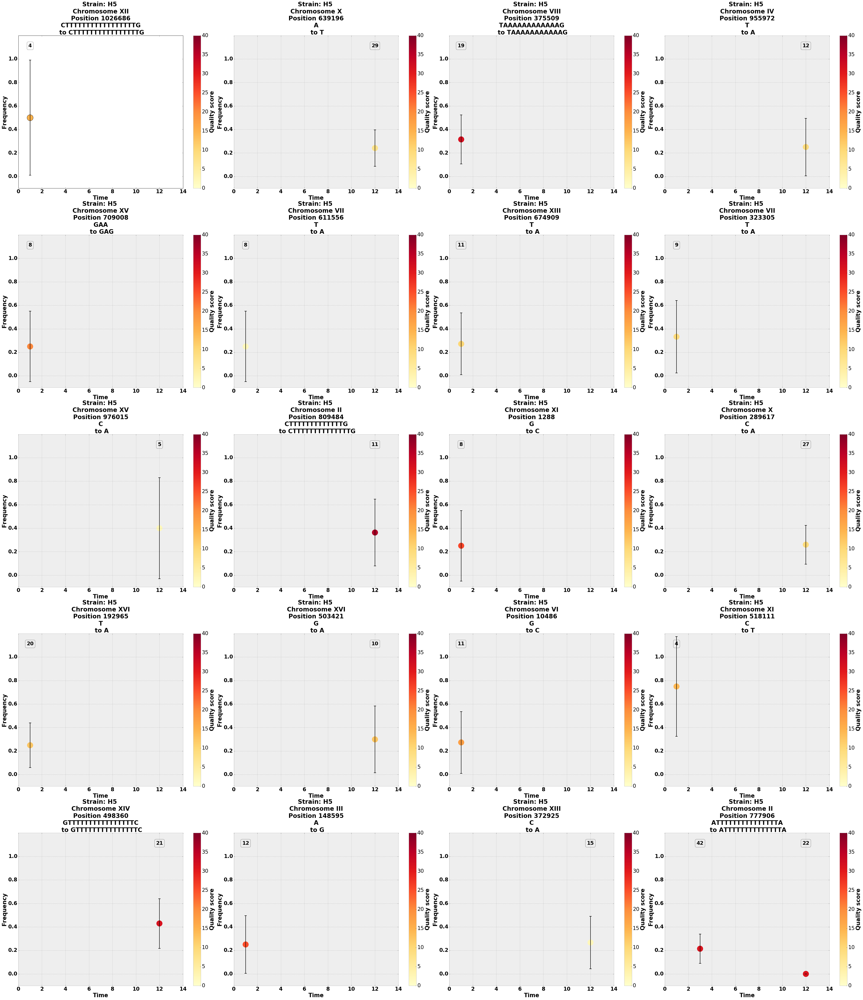

In [6]:
#Plot the data for the focal strain


counter = 1
treatment = test_strain[0]
strain_num = int(test_strain[1:len(test_strain)])


fig = plt.figure(figsize=(56,64))
for row in rand_sample.itertuples():
    chrom = row.CHROM
    pos = row.POS

    allele = allele_time_series.get_group((treatment,strain_num,chrom,pos))
        
        
    if allele.shape[1] == 6:
        
        
        N = np.array(allele['Num_alt'])+np.array(allele['Num_ref'])
        x = list(allele['Time'])
        y = list(allele['Freq_alt'])
        err = 1.96*np.sqrt(np.divide((np.ones(6)-y)*y,N))
        qual = list(allele['Qual_alt'])
            
    else:
        N = np.array(allele['Num_alt'])[0:6]+np.array(allele['Num_ref'])[0:6]
        x = list(allele['Time'])[0:6]
        y = list(allele['Freq_alt'])[0:6]
        err = 1.96*np.sqrt(np.divide((np.ones(6)-y)*y,N))[0:6]
        qual = list(allele['Qual_alt'])[0:6]

    ref = allele['Ref'].iloc[0]
    alt = allele['Alt'].iloc[0]
    treatment = allele['Treatment'].iloc[0]
    strain = str(allele['Strain'].iloc[0])
    chrom = allele['Chromosome'].iloc[0]
    pos = str(int(allele['Position'].iloc[0]))

    plt.subplot(5,4,counter)
    
    plt.ylabel('Frequency',fontsize=26,fontweight='bold')
    plt.xlabel('Time',fontsize=26,fontweight='bold')
    plt.ylim([-0.1,1.2])
    plt.yticks([0.0,0.2,0.4,0.6,0.8,1.0],size=24,fontweight='bold')
    plt.xlim([0,14])
    plt.xticks([0,2,4,6,8,10,12,14],size=24,fontweight='bold')
    plt.scatter(x,y,s=800,c=qual,cmap='YlOrRd')
    plt.clim(0,40)
    plt.style.use('bmh')
    plt.title('Strain: %s%s \n Chromosome %s \n Position %s \n %s \n to %s' %(treatment,strain,chrom,pos,ref,alt), fontsize=28,fontweight='bold')

    cb = plt.colorbar()
    cb.set_label(label='Quality score',fontsize=26,weight='bold')
    cb.set_ticks([0,5,10,15,20,25,30,35,40])
    cb.ax.tick_params(labelsize=24)
        
    (_, caps, _) = plt.errorbar(x,y,yerr=err,ls='None',color='k',capsize=5)
    for cap in caps:
        cap.set_markeredgewidth(2)

    for i in range(len(x)):
        if not np.isnan(N[i]):
            plt.text(x[i],1.1,int(N[i]),ha='center',fontsize = 23, fontweight='bold',bbox=dict(facecolor='none', edgecolor='black', boxstyle='round'))
        
    plt.tight_layout()
        
    counter = counter+1




Composite scores of nan are those with only a single observation of nonzero frequency

## Plot top composite scores
Plots the 20 highest composite scores for alleles not found in ancestor for each strain

In [54]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

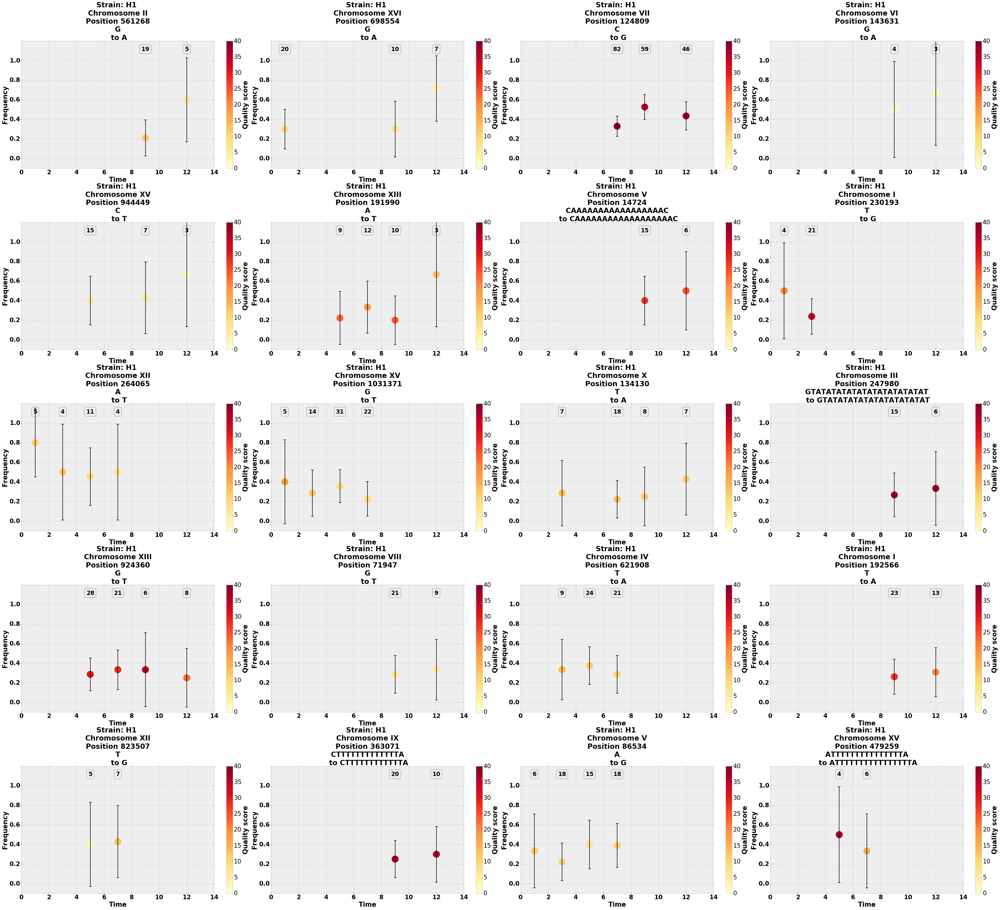

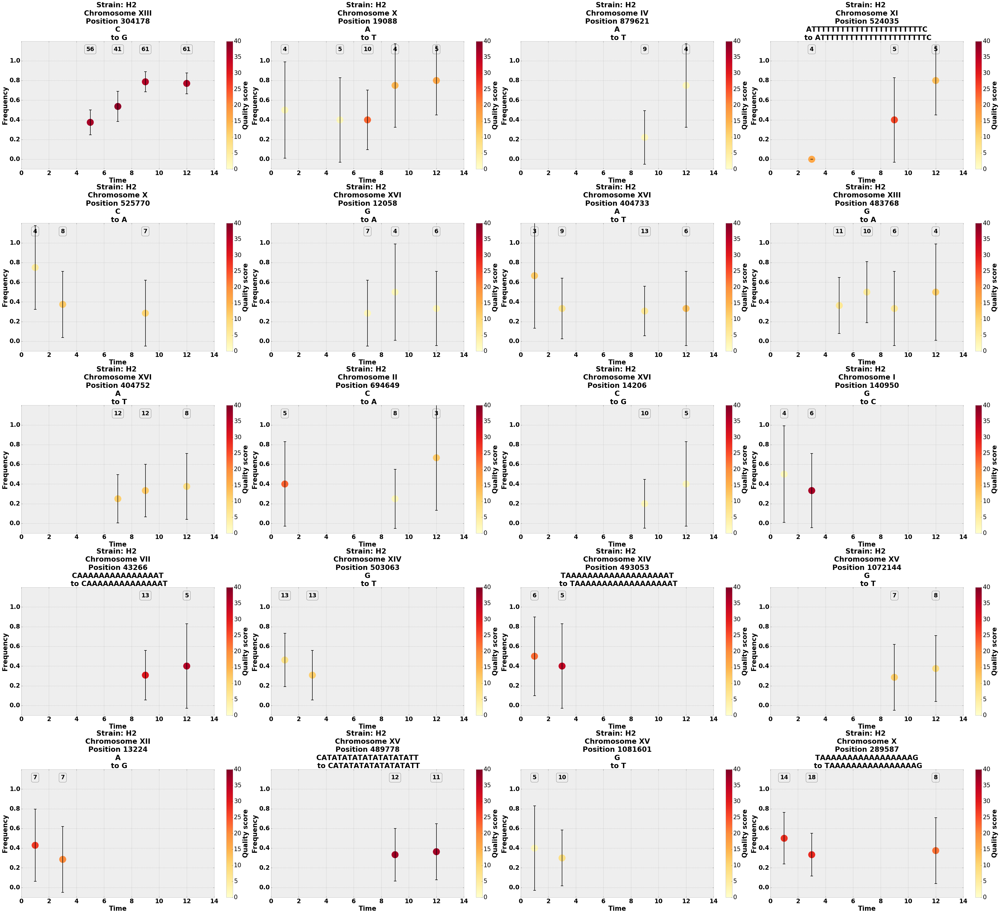

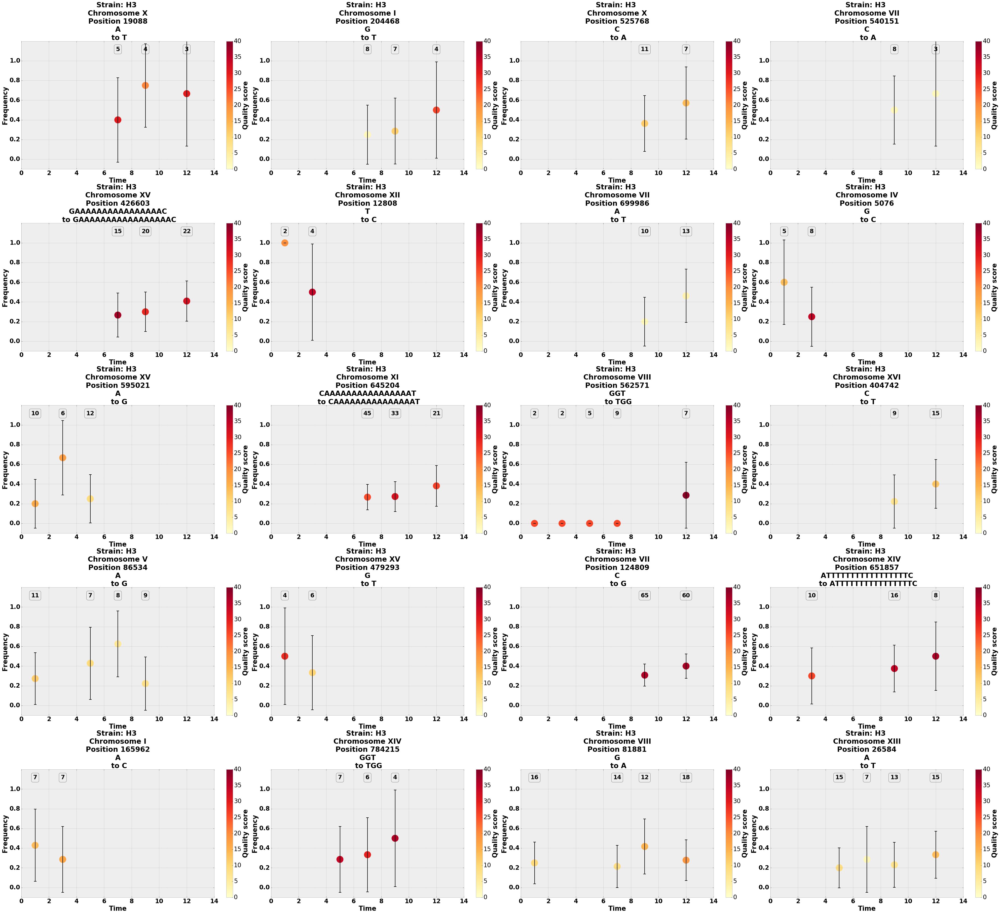

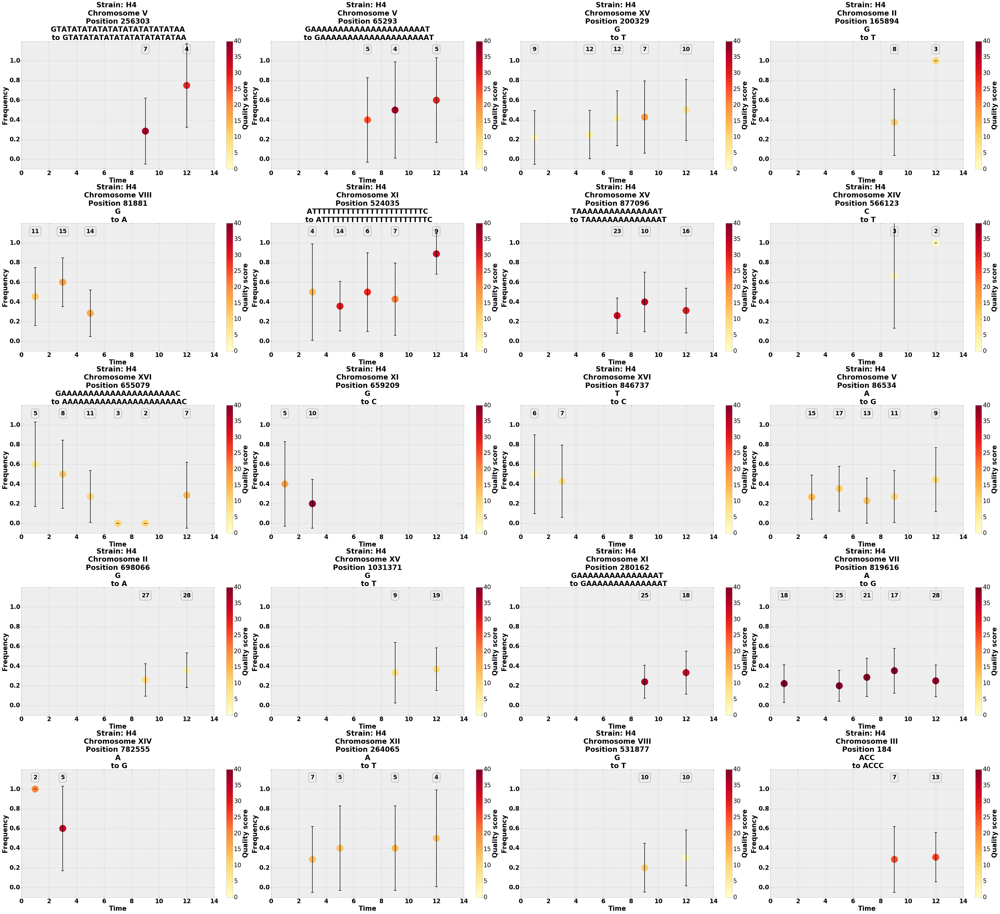

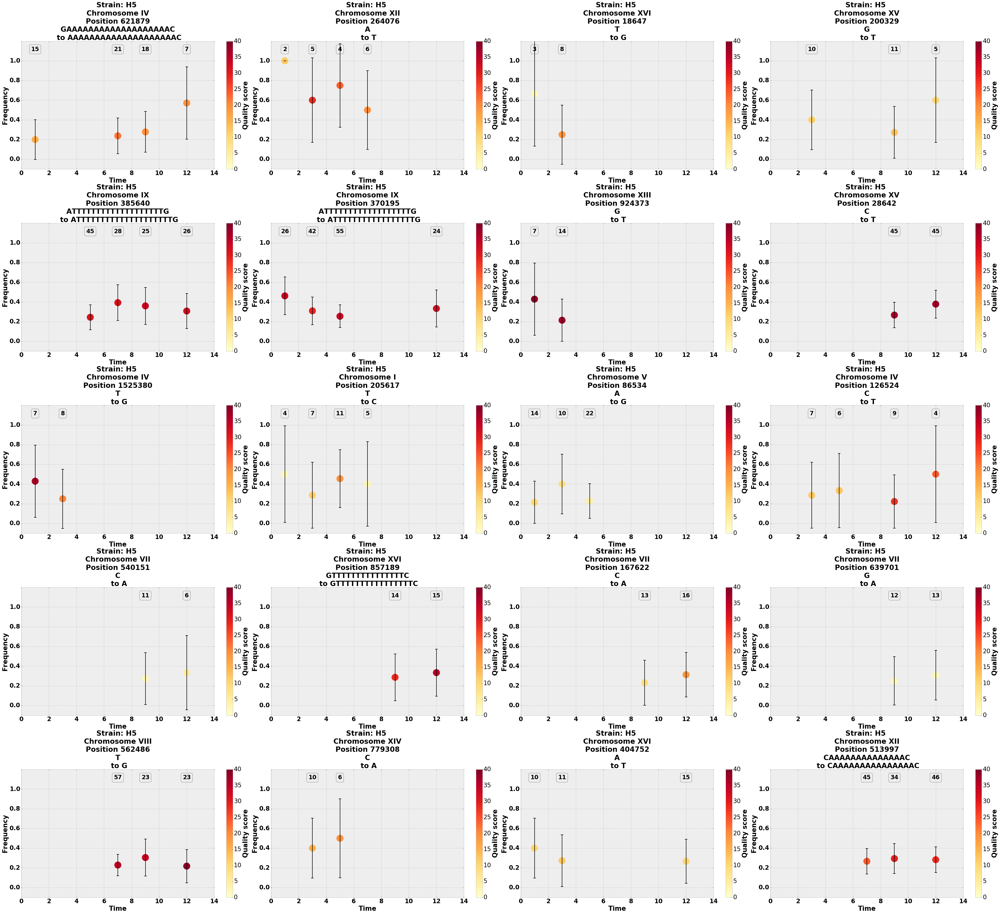

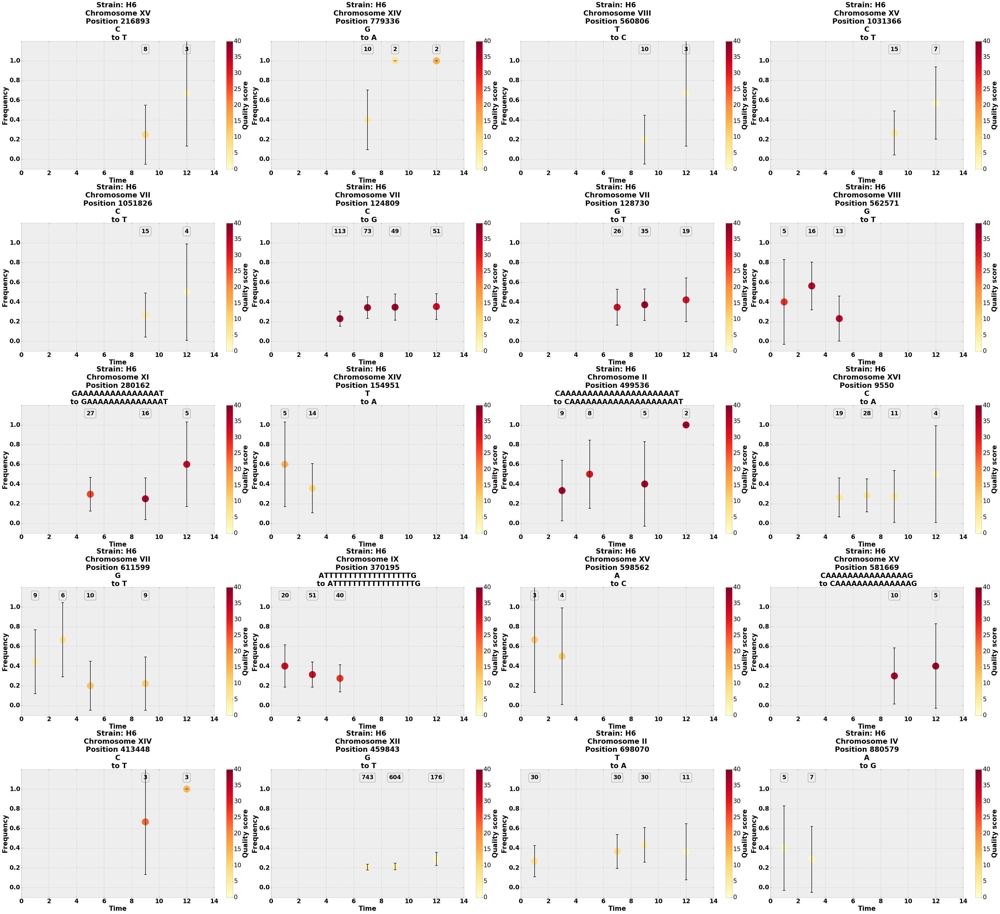

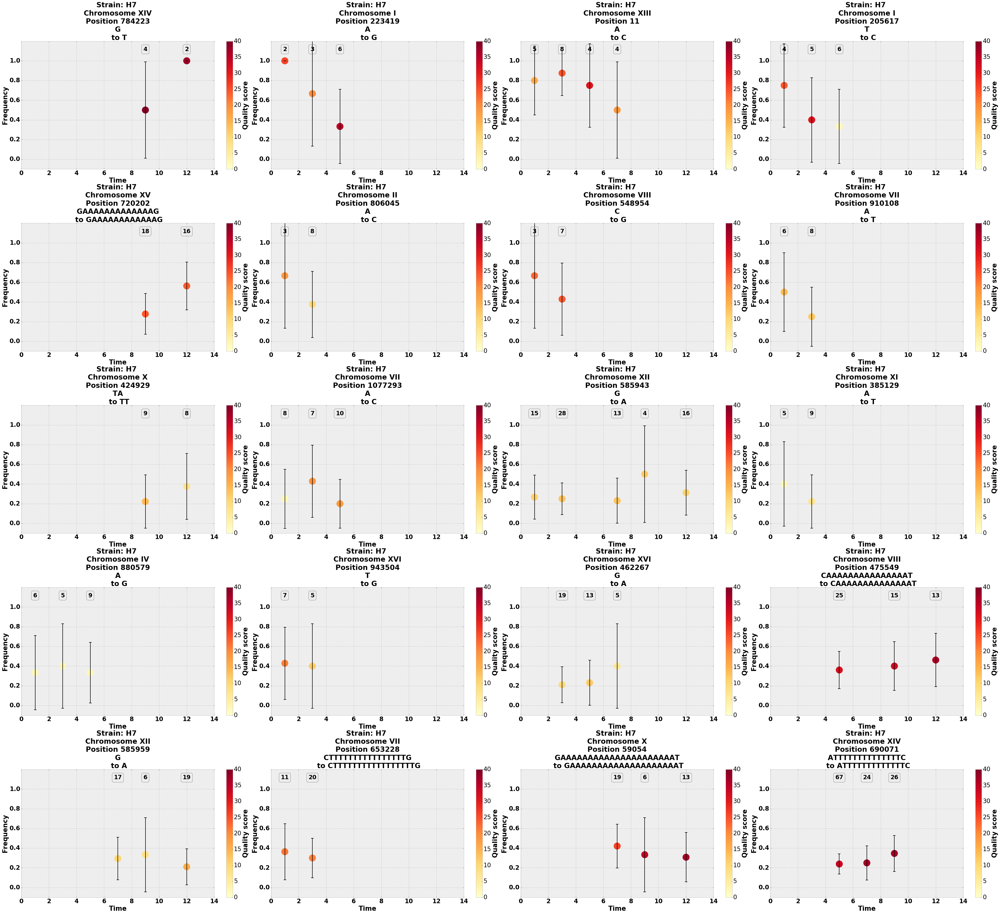

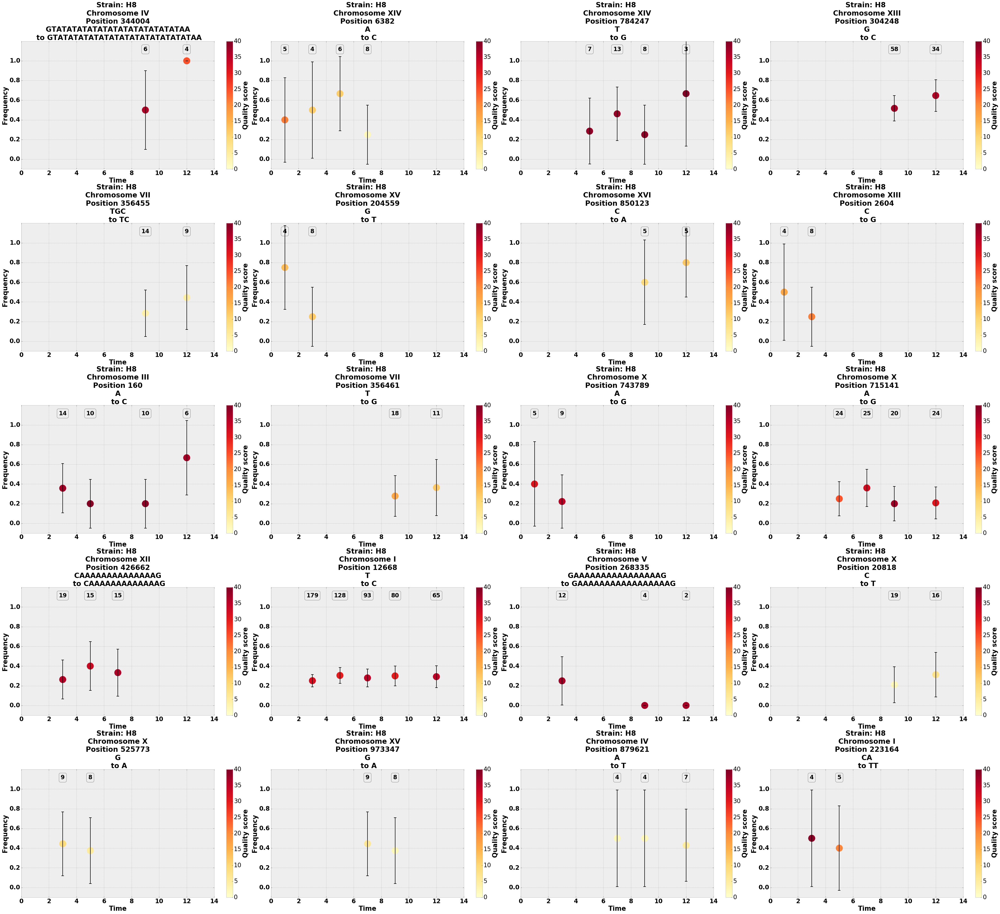

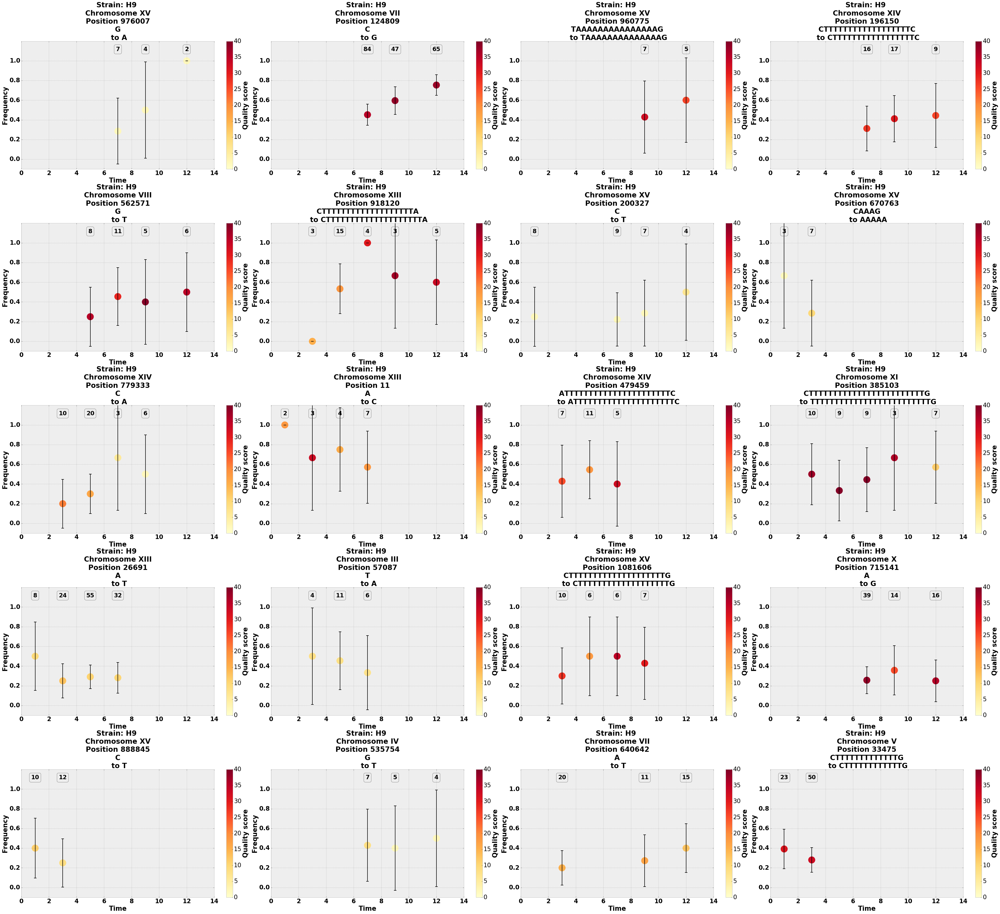

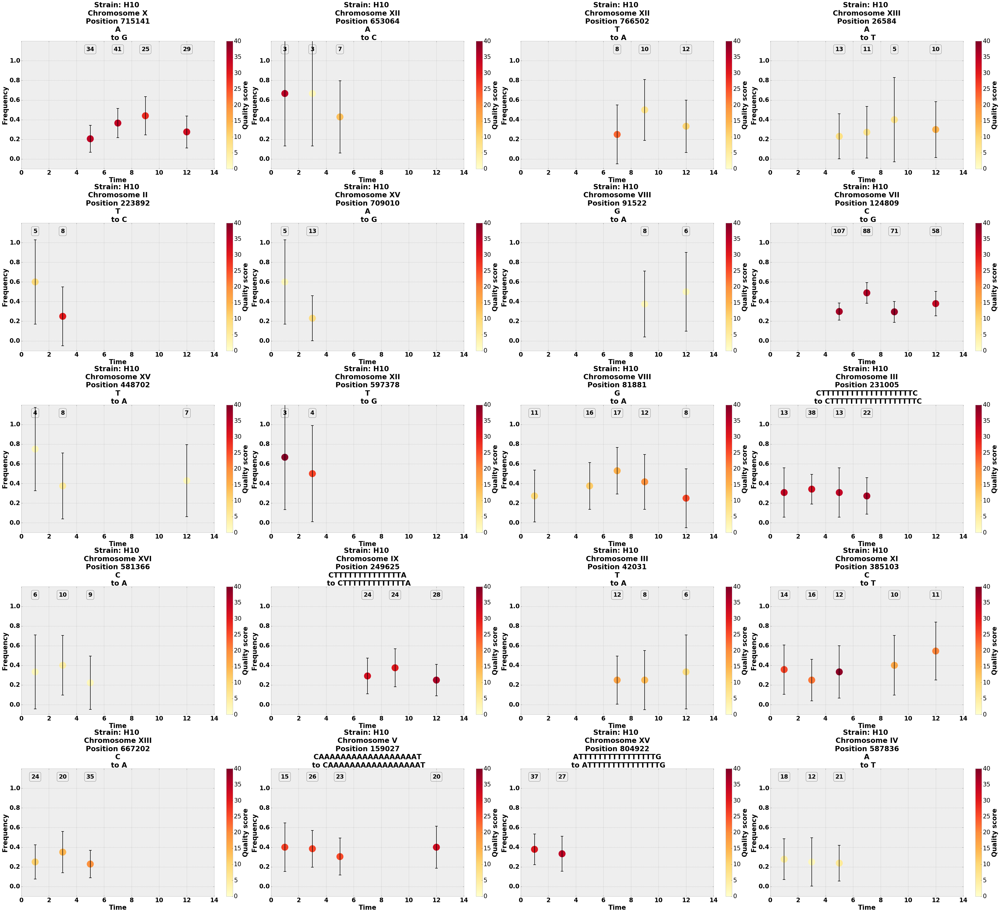

In [55]:
#Plot the data for the focal strain

strains = ['H1','H2','H3','H4','H5','H6','H7','H8','H9','H10']
counter = 1
for strain in strains:
    df = data_dict[strain]
    treatment = strain[0]
    strain_num = int(strain[1:len(strain)])
    
    top20 = df.iloc[0:20]
    
    
    fig = plt.figure(figsize=(56,500))
    #fig.suptitle("Strain %s" %strain, fontsize=24,fontweight='bold')
    
    for row in top20.itertuples():
        chrom = row.CHROM
        pos = row.POS
        allele = allele_time_series.get_group((treatment,strain_num,chrom,pos))
        
        
        if allele.shape[1] == 6:
        
        
            N = np.array(allele['Num_alt'])+np.array(allele['Num_ref'])
            x = list(allele['Time'])
            y = list(allele['Freq_alt'])
            err = 1.96*np.sqrt(np.divide((np.ones(6)-y)*y,N))
            qual = list(allele['Qual_alt'])
            
        else:
            N = np.array(allele['Num_alt'])[0:6]+np.array(allele['Num_ref'])[0:6]
            x = list(allele['Time'])[0:6]
            y = list(allele['Freq_alt'])[0:6]
            err = 1.96*np.sqrt(np.divide((np.ones(6)-y)*y,N))[0:6]
            qual = list(allele['Qual_alt'])[0:6]

        ref = allele['Ref'].iloc[0]
        alt = allele['Alt'].iloc[0]
        treatment = allele['Treatment'].iloc[0]
        strain = str(allele['Strain'].iloc[0])
        chrom = allele['Chromosome'].iloc[0]
        pos = str(int(allele['Position'].iloc[0]))
          
        plt.subplot(50,4,counter)
        plt.ylabel('Frequency',fontsize=26,fontweight='bold')
        plt.xlabel('Time',fontsize=26,fontweight='bold')
        plt.ylim([-0.1,1.2])
        plt.yticks([0.0,0.2,0.4,0.6,0.8,1.0],size=24,fontweight='bold')
        plt.xlim([0,14])
        plt.xticks([0,2,4,6,8,10,12,14],size=24,fontweight='bold')
        plt.scatter(x,y,s=800,c=qual,cmap='YlOrRd')
        plt.clim(0,40)
        plt.style.use('bmh')
        plt.title('Strain: %s%s \n Chromosome %s \n Position %s \n %s \n to %s' %(treatment,strain,chrom,pos,ref,alt), fontsize=28,fontweight='bold')

        cb = plt.colorbar()
        cb.set_label(label='Quality score',fontsize=26,weight='bold')
        cb.set_ticks([0,5,10,15,20,25,30,35,40])
        cb.ax.tick_params(labelsize=24)
        
        (_, caps, _) = plt.errorbar(x,y,yerr=err,ls='None',color='k',capsize=5)
        for cap in caps:
            cap.set_markeredgewidth(2)

        for i in range(len(x)):
            if not np.isnan(N[i]):
                plt.text(x[i],1.1,int(N[i]),ha='center',fontsize = 23, fontweight='bold',bbox=dict(facecolor='none', edgecolor='black', boxstyle='round'))
        
        plt.tight_layout()
        
        counter = counter+1




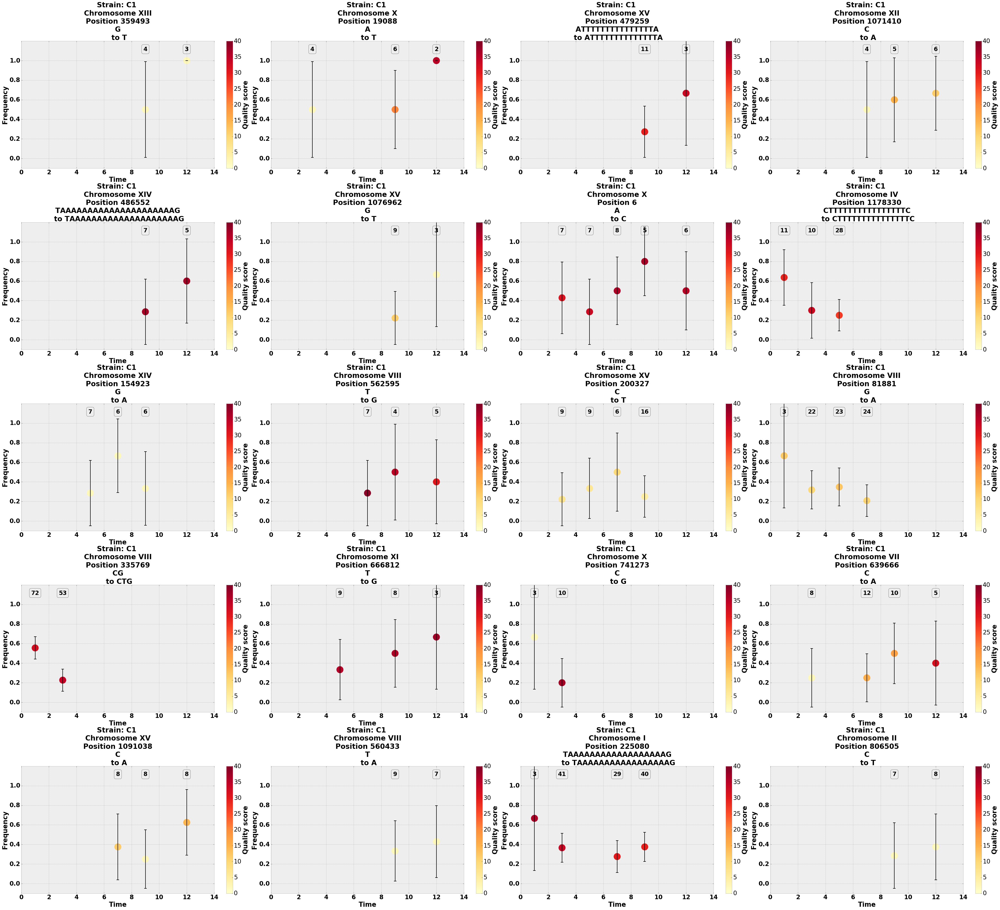

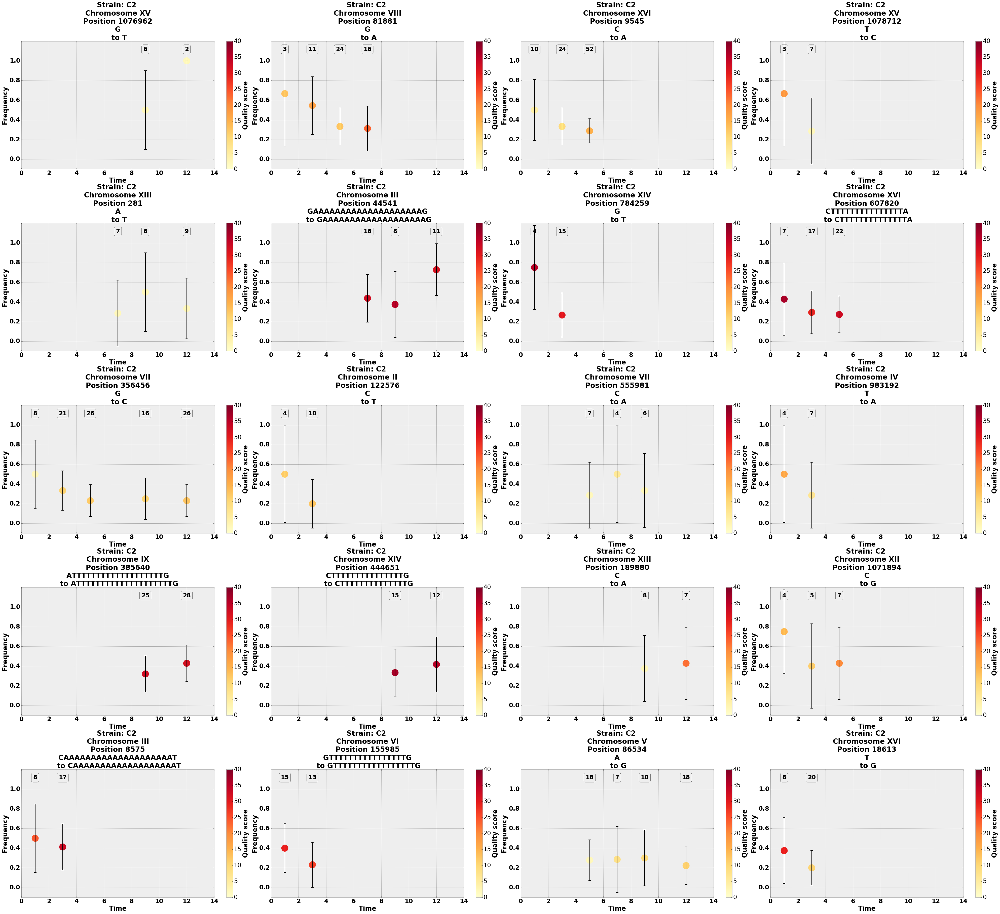

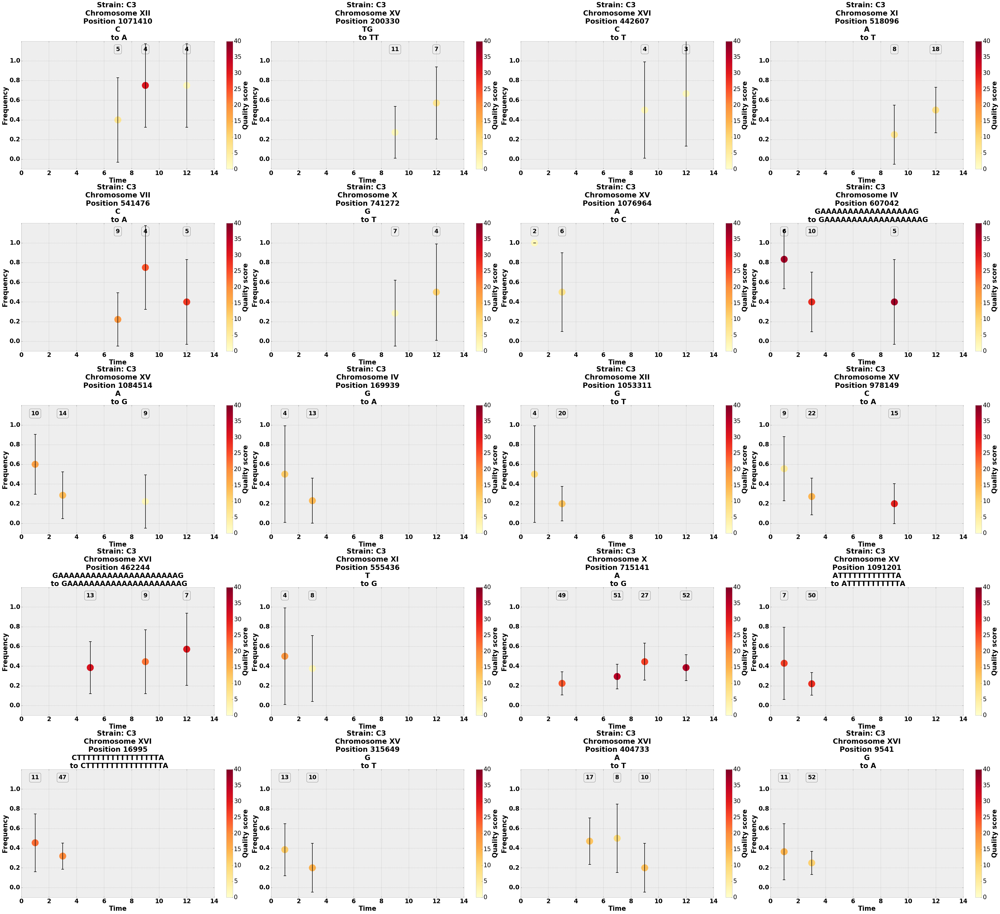

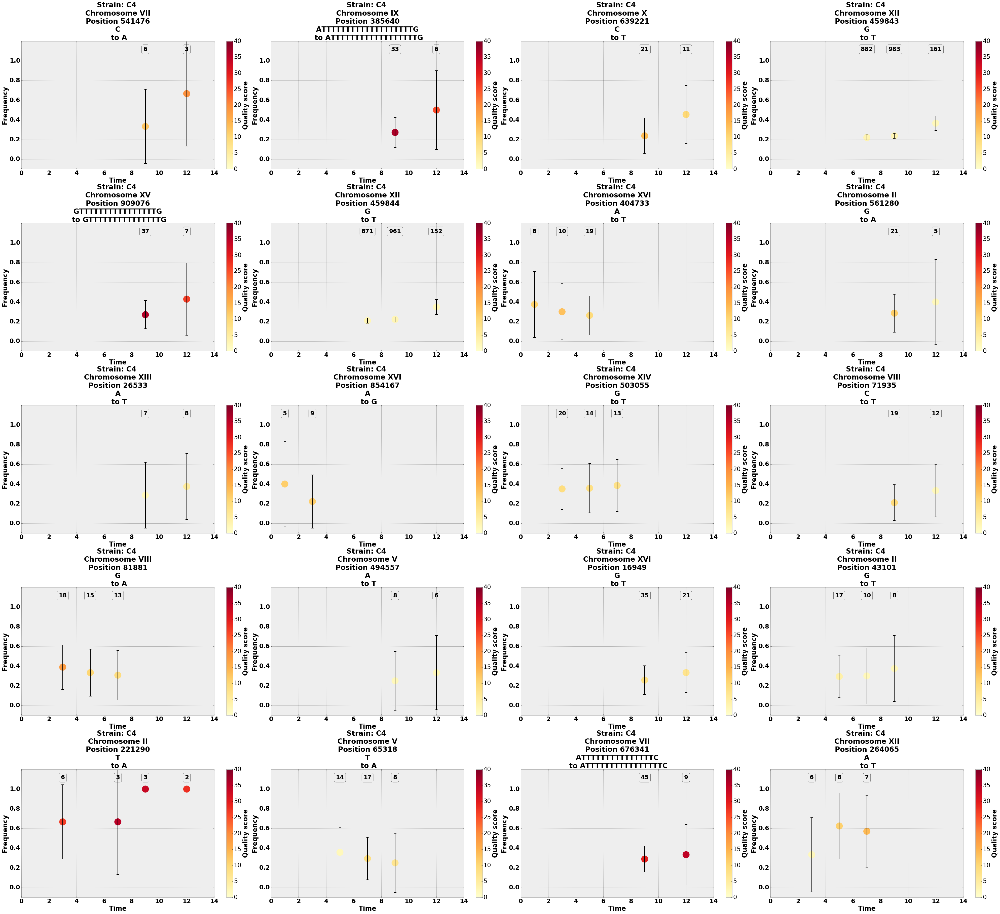

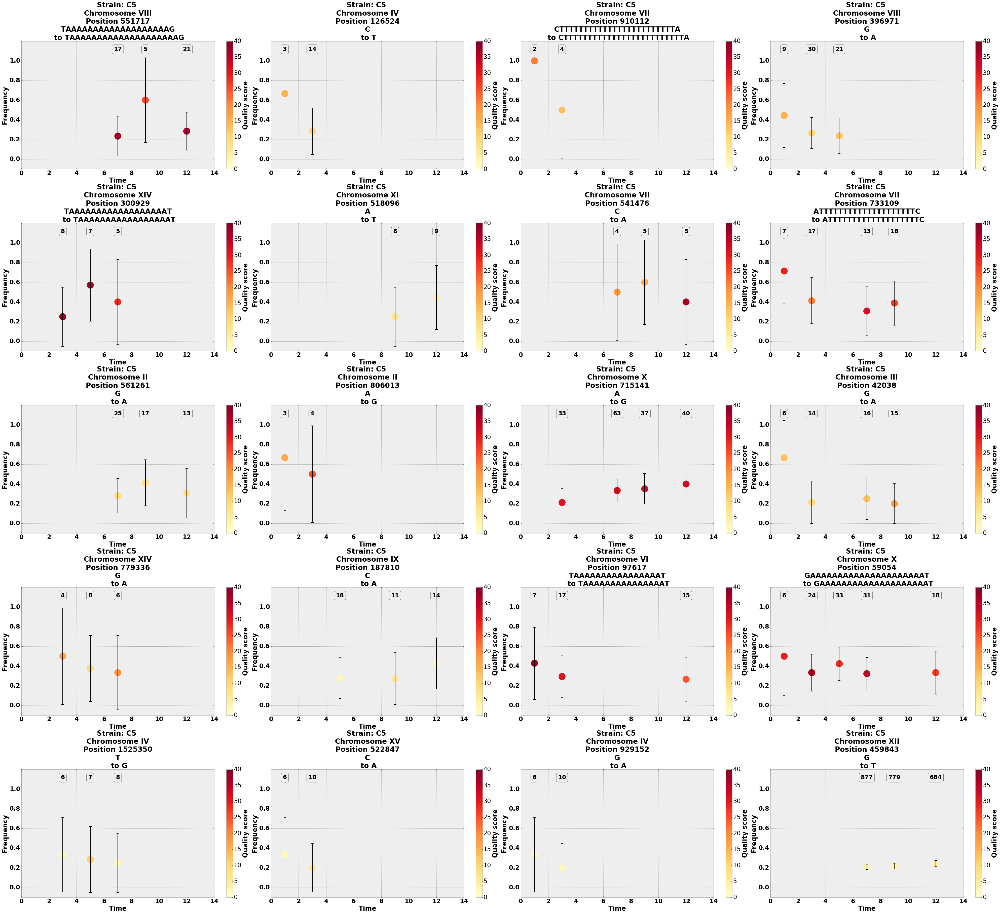

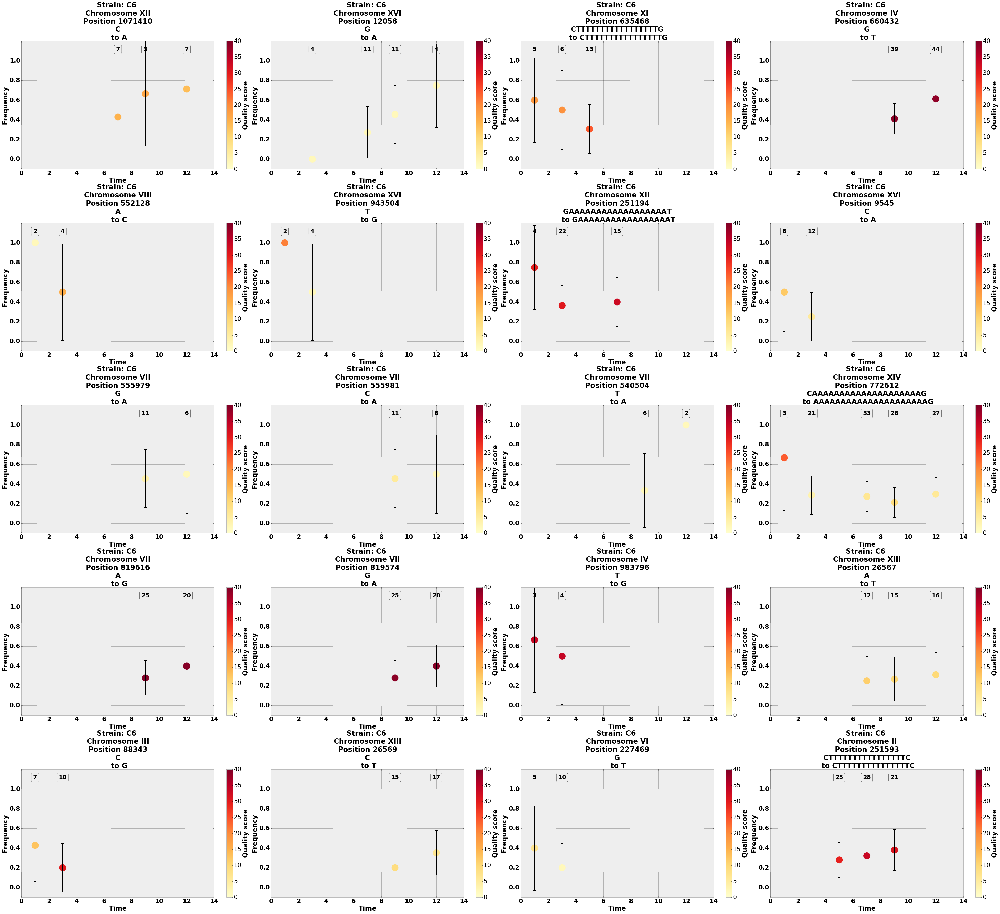

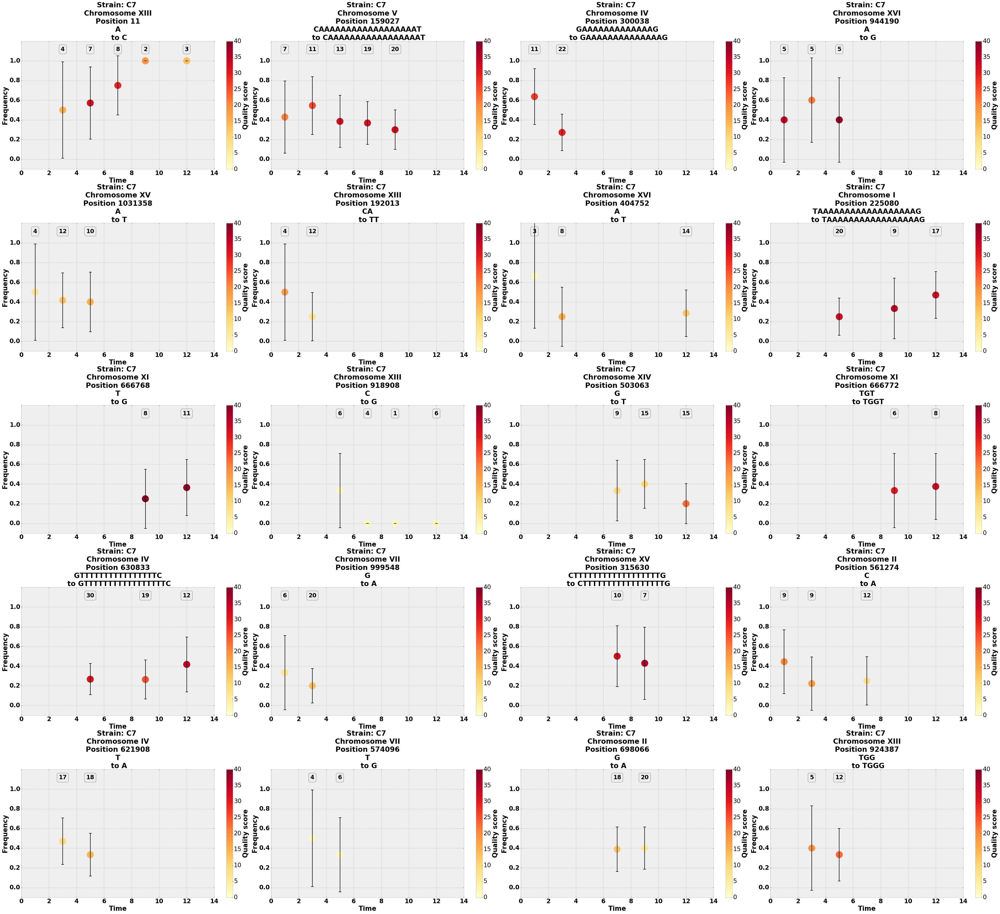

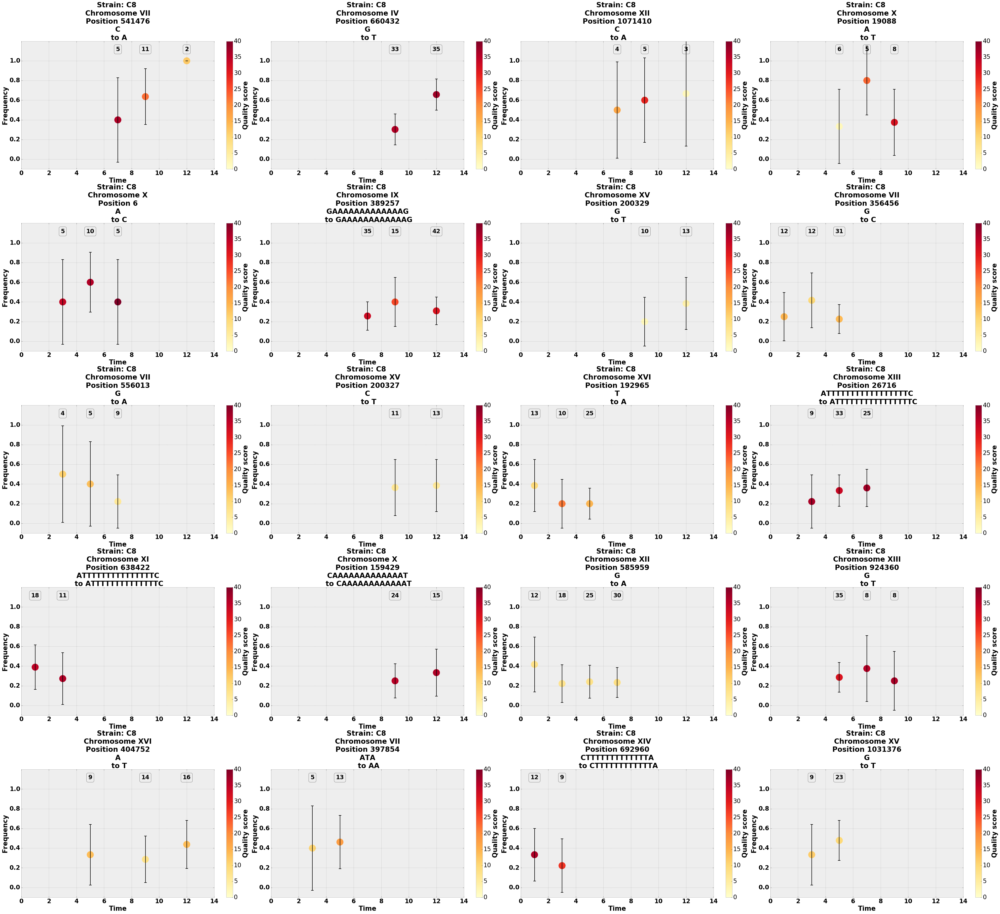

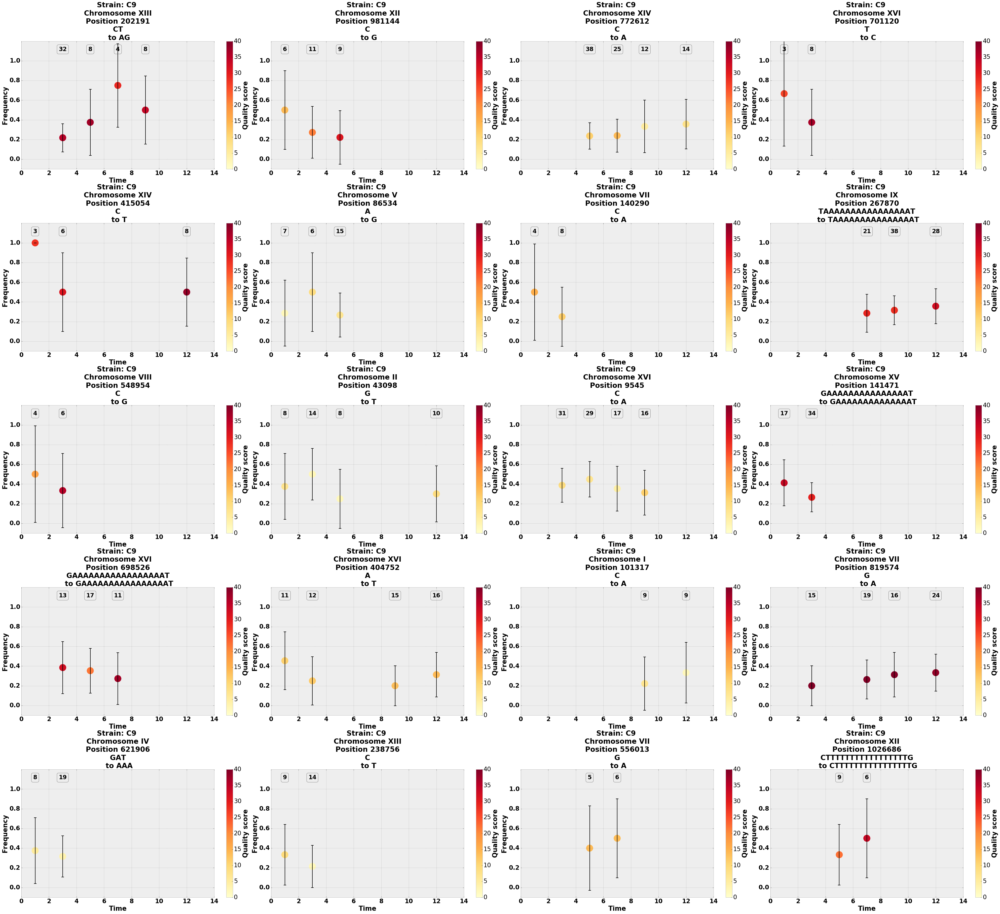

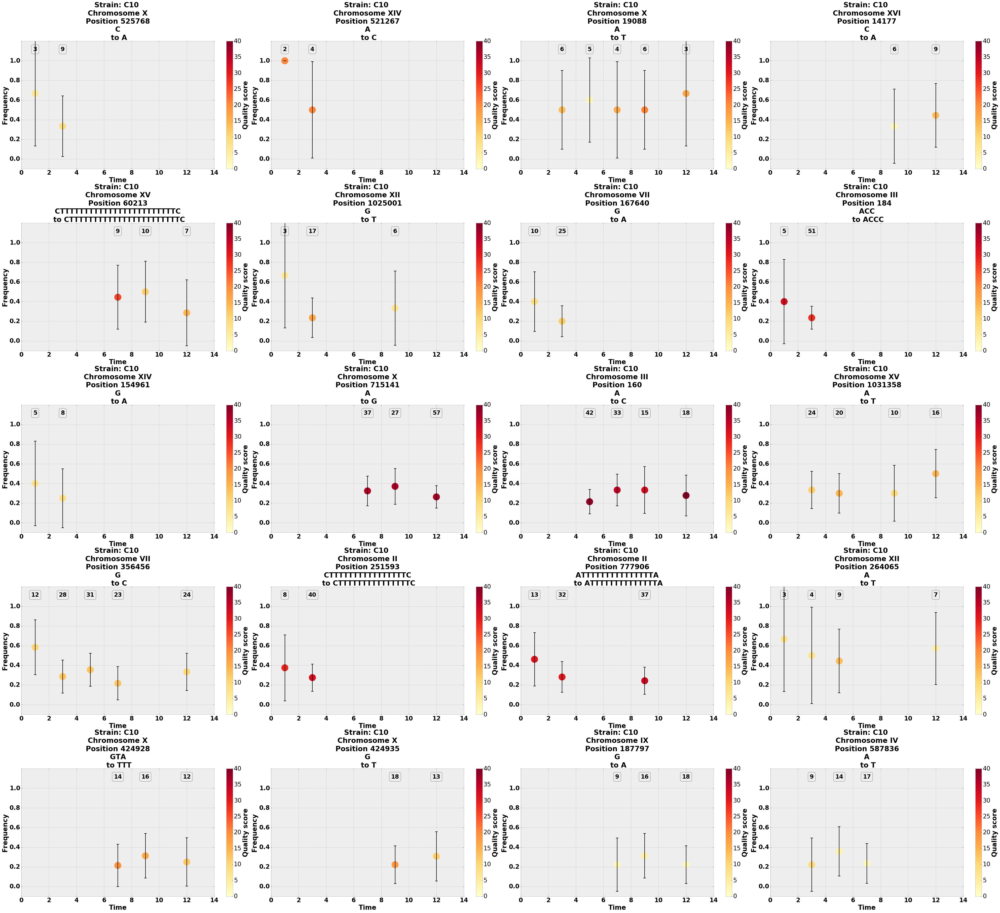

In [56]:
#Plot the data for the focal strain

strains = ['C1','C2','C3','C4','C5','C6','C7','C8','C9','C10']
counter = 1
for strain in strains:
    df = data_dict[strain]
    treatment = strain[0]
    strain_num = int(strain[1:len(strain)])
    
    top20 = df.iloc[0:20]
    
    
    fig = plt.figure(figsize=(56,500))
    #fig.suptitle("Strain %s" %strain, fontsize=24,fontweight='bold')
    
    for row in top20.itertuples():
        chrom = row.CHROM
        pos = row.POS
        allele = allele_time_series.get_group((treatment,strain_num,chrom,pos))
        
        
        if allele.shape[1] == 6:
        
        
            N = np.array(allele['Num_alt'])+np.array(allele['Num_ref'])
            x = list(allele['Time'])
            y = list(allele['Freq_alt'])
            err = 1.96*np.sqrt(np.divide((np.ones(6)-y)*y,N))
            qual = list(allele['Qual_alt'])
            
        else:
            N = np.array(allele['Num_alt'])[0:6]+np.array(allele['Num_ref'])[0:6]
            x = list(allele['Time'])[0:6]
            y = list(allele['Freq_alt'])[0:6]
            err = 1.96*np.sqrt(np.divide((np.ones(6)-y)*y,N))[0:6]
            qual = list(allele['Qual_alt'])[0:6]

        ref = allele['Ref'].iloc[0]
        alt = allele['Alt'].iloc[0]
        treatment = allele['Treatment'].iloc[0]
        strain = str(allele['Strain'].iloc[0])
        chrom = allele['Chromosome'].iloc[0]
        pos = str(int(allele['Position'].iloc[0]))
          
        plt.subplot(50,4,counter)
        plt.ylabel('Frequency',fontsize=26,fontweight='bold')
        plt.xlabel('Time',fontsize=26,fontweight='bold')
        plt.ylim([-0.1,1.2])
        plt.yticks([0.0,0.2,0.4,0.6,0.8,1.0],size=24,fontweight='bold')
        plt.xlim([0,14])
        plt.xticks([0,2,4,6,8,10,12,14],size=24,fontweight='bold')
        plt.scatter(x,y,s=800,c=qual,cmap='YlOrRd')
        plt.clim(0,40)
        plt.style.use('bmh')
        plt.title('Strain: %s%s \n Chromosome %s \n Position %s \n %s \n to %s' %(treatment,strain,chrom,pos,ref,alt), fontsize=28,fontweight='bold')

        cb = plt.colorbar()
        cb.set_label(label='Quality score',fontsize=26,weight='bold')
        cb.set_ticks([0,5,10,15,20,25,30,35,40])
        cb.ax.tick_params(labelsize=24)
        
        (_, caps, _) = plt.errorbar(x,y,yerr=err,ls='None',color='k',capsize=5)
        for cap in caps:
            cap.set_markeredgewidth(2)

        for i in range(len(x)):
            if not np.isnan(N[i]):
                plt.text(x[i],1.1,int(N[i]),ha='center',fontsize = 23, fontweight='bold',bbox=dict(facecolor='none', edgecolor='black', boxstyle='round'))
        
        plt.tight_layout()
        
        counter = counter+1




## Check for any variants in mds3 or sok2 genes

In [22]:
#allele_time_series = alleles.groupby(['Treatment','Strain','Chromosome','Position'])

mds3 = alleles[(alleles['Chromosome']=='VII') & (alleles['Position'] > 124500) & (alleles['Position'] < 130000)]
mds3_H = mds3[mds3['Treatment']=='H']
#sok2 = alleles.groupby(['Chromosome','Position']).filter(lambda x: (x['Chromosome']=='XIII')
#                                                         & (x['Position'] > 305000) & (x['Position'] < 304000))

num_mds3 = mds3.shape[0]/6
num_mds3_H = mds3_H.shape[0]/6

mut_groups = mds3.groupby(['Treatment','Strain','Position','Alt'])



print('There are %d mutations in mds3, %d are from H strain' %(num_mds3,num_mds3_H))

There are 13 mutations in mds3, 13 are from H strain


In [17]:
mds3.head(13*6)

,Unnamed: 0,Chromosome,Position,Alt,Time,Ref,Is_repeat,Read_depth,Num_ref,Num_alt,Freq_ref,Freq_alt,Qual_ref,Qual_alt,Treatment,Strain
199866,199866,VII,124809,G,1,C,0,NaN,NaN,0,NaN,0.000000,NaN,NaN,H,1
199867,199867,VII,124809,G,3,C,0,NaN,NaN,0,NaN,0.000000,NaN,NaN,H,1
199868,199868,VII,124809,G,5,C,0,NaN,NaN,0,NaN,0.000000,NaN,NaN,H,1
199869,199869,VII,124809,G,7,C,0,83,55,27,0.670732,0.329268,37.472727,38.814815,H,1
199870,199870,VII,124809,G,9,C,0,59,28,31,0.474576,0.525424,35.571429,35.741935,H,1
199871,199871,VII,124809,G,12,C,0,46,26,20,0.565217,0.434783,35.923077,37.950000,H,1
219168,219168,VII,125345,T,1,G,0,NaN,NaN,0,NaN,0.000000,NaN,NaN,H,2
219169,219169,VII,125345,T,3,G,0,NaN,NaN,0,NaN,0.000000,NaN,NaN,H,2
219170,219170,VII,125345,T,5,G,0,NaN,NaN,0,NaN,0.000000,NaN,NaN,H,2
219171,219171,VII,125345,T,7,G,0,77,60,16,0.789474,0.210526,36.600000,36.875000,H,2


In [111]:
#save record of screened alleles so they can be removed in subsequent screens
strains = ['C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','H1','H2','H3','H4','H5','H6','H7','H8','H9','H10']

counter = 0
for strain in strains:
    df = data_dict[strain]
    temp = df.iloc[0:20]
    
    temp['Treatment'] = strain[0]
    temp['Strain'] = int(strain[1:len(strain)])

    
    if counter ==0:
         screened = temp
    else:
        screened = screened.append(temp)
        
    counter=counter+1

print(screened.shape)
screened.to_csv('/Users/chrisgraves/Documents/Yeast_data/Sequencing/saved_dfs/screened_alleles_composite.csv',index=False)

/Users/chrisgraves/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/chrisgraves/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


(400, 16)


In [112]:
temp.head()

,CHROM,POS,NUM_ALT,INTEGRAL,AUTOCORR,MIN,MAX,MAX_STEP,MAX_DIFF,TOTAL_READS,MAX_RUN,REL_DIFF,COMPOSITE,In_parent,Treatment,Strain
1518,X,715141,0.333333,0.628760,0.853452,0,0.440000,0.205882,0.440000,0.013735,0.375385,44.000000,12.652126,0,H,10
1786,XII,653064,0.333333,0.276190,0.911003,0,0.666667,0.428571,0.666667,0.001384,0.333333,66.666667,12.620049,0,H,10
1810,XII,766502,0.333333,0.608333,0.832279,0,0.500000,0.250000,0.500000,0.003194,0.307692,50.000000,12.606097,0,H,10
1895,XIII,26584,0.333333,0.620350,0.856424,0,0.400000,0.230769,0.400000,0.004152,0.369231,40.000000,12.582688,0,H,10
244,II,223892,0.333333,0.225000,0.955902,0,0.600000,0.350000,0.600000,0.001384,0.323077,60.000000,12.579957,0,H,10


#### Conclusions

- By plotting the top 20 composite scores several mutations with frequency trajectories like those of beneficial mutations were discovered
- Of these, many can be eliminated as possibilities due to presence in the ancestral data (suggesting fixed mutation or common sequencing error) or low quality scores for assignment
- Surprisingly few strong candidates are identified, including none that show clear signs of fixation. 
- Top mutational candidates were manually recorded for analysis of the variant in the raw alignment and identification of the genomic context